##Обучение YOLOv11

### Загрузка датасета

In [1]:
import kagglehub

path = kagglehub.dataset_download("mahmoodyousaf/fish-dataset")

print("Path to dataset files:", path)

100%|██████████| 342M/342M [00:17<00:00, 19.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1


In [2]:
import os
files = os.listdir(path)
print("Files in dataset:", files)

Files in dataset: ['data.yaml', 'README.dataset.txt', 'valid', 'test', 'train', 'README.roboflow.txt']


###Установка модели

In [3]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 103.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

100%|██████████| 5.35M/5.35M [00:00<00:00, 315MB/s]


In [5]:
root = "/root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1"

###Обучение

In [8]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

train_results = model.train(
    data=f"{root}/data.yaml",
    epochs=10,
    imgsz=480,
    device=0)

Ultralytics 8.3.134 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=480, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, pe

100%|██████████| 755k/755k [00:00<00:00, 102MB/s]

Overriding model.yaml nc=80 with nc=13

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

YOLO11n summary: 181 layers, 2,592,375 parameters, 2,592,359 gradients, 6.5 GFLOPs

Transferred 448/499 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...
AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 24.5±7.2 MB/s, size: 46.5 KB)


train: Scanning /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/train/labels... 6842 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6842/6842 [00:08<00:00, 850.15it/s]


train: New cache created: /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 536, len(boxes) = 14154. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 10.6±2.6 MB/s, size: 37.0 KB)


val: Scanning /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/valid/labels... 700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 700/700 [00:01<00:00, 661.54it/s]

val: New cache created: /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 84, len(boxes) = 1197. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000588, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 480 train, 480 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      1.36G      1.299      2.963      1.434         13        480: 100%|██████████| 428/428 [01:40<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:06<00:00,  3.28it/s]

                   all        700       1197      0.631      0.604      0.626       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.59G      1.292      1.836      1.392         15        480: 100%|██████████| 428/428 [01:37<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:05<00:00,  3.83it/s]


                   all        700       1197      0.692      0.678      0.713       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.59G      1.249      1.507      1.334         25        480: 100%|██████████| 428/428 [01:36<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:06<00:00,  3.58it/s]

                   all        700       1197      0.702      0.699      0.755      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.59G      1.213      1.291       1.31         14        480: 100%|██████████| 428/428 [01:35<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:04<00:00,  4.54it/s]

                   all        700       1197      0.733      0.773      0.778      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.59G      1.157      1.119      1.268         19        480: 100%|██████████| 428/428 [01:35<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:04<00:00,  4.60it/s]


                   all        700       1197       0.78      0.808      0.841      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.59G      1.119     0.9863      1.241         23        480: 100%|██████████| 428/428 [01:32<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:05<00:00,  3.89it/s]

                   all        700       1197      0.859      0.812       0.87      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.59G      1.073     0.8719      1.218         11        480: 100%|██████████| 428/428 [01:33<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:06<00:00,  3.67it/s]


                   all        700       1197      0.814       0.85      0.838      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      1.59G      1.036     0.8023       1.19         24        480: 100%|██████████| 428/428 [01:36<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:04<00:00,  4.46it/s]

                   all        700       1197      0.875       0.86      0.913      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.59G     0.9871     0.7214      1.157         11        480: 100%|██████████| 428/428 [01:34<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:05<00:00,  3.73it/s]

                   all        700       1197      0.861      0.882      0.909      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.59G     0.9595     0.6795      1.142         34        480: 100%|██████████| 428/428 [01:34<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:04<00:00,  4.55it/s]


                   all        700       1197      0.879      0.881      0.911      0.683

10 epochs completed in 0.283 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.134 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,584,687 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:07<00:00,  2.82it/s]


                   all        700       1197      0.879      0.881      0.911      0.682
              BlueTang          7         23      0.871      0.913      0.942      0.862
         ButterflyFish         10         47      0.876      0.894      0.884      0.458
             ClownFish         28         41      0.909      0.805      0.904      0.668
              GoldFish         62        134      0.845      0.888      0.949      0.675
               Gourami        188        210      0.988          1      0.995      0.913
            MorishIdol         23         31      0.937      0.958      0.953      0.775
             PlatyFish         50        102      0.725      0.794      0.831       0.58
     RibbonedSweetlips         22         67      0.764      0.851      0.871      0.636
ThreeStripedDamselfish         79        108      0.943      0.963      0.987      0.807
         YellowCichlid         22         95       0.83      0.611      0.667      0.344
            YellowTan

В качестве главной метрики был выбран mAP, так как он сочетает в себе как точность, так и полноту. Первоначальный результат до улучшения 0,911

###Анализ

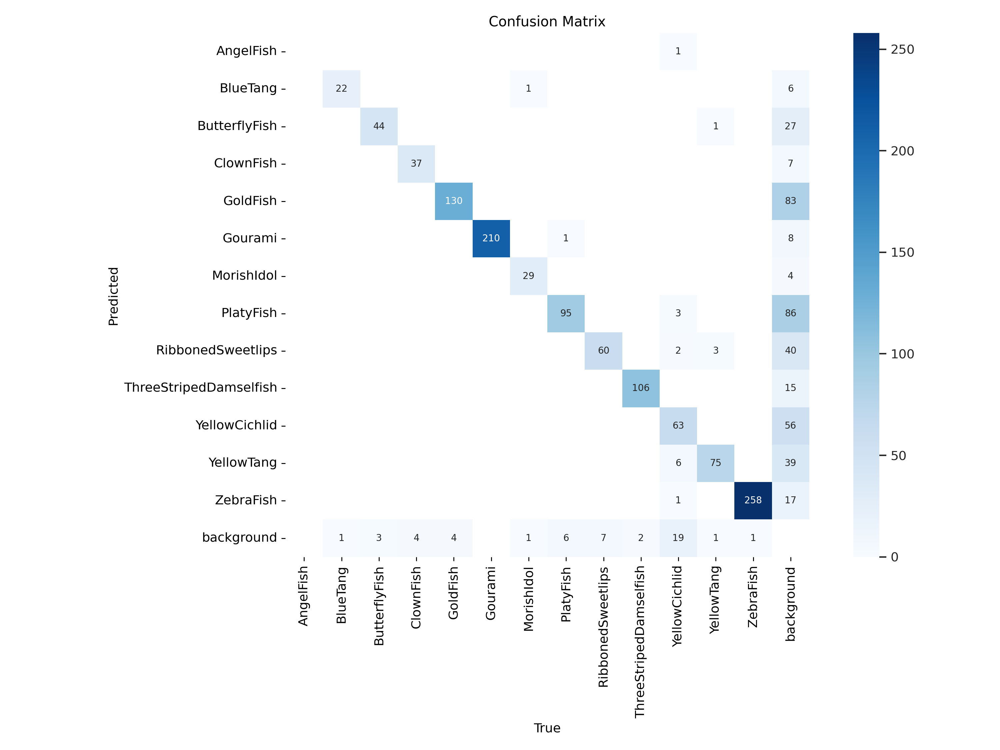

In [9]:
Image.open(f"runs/detect/train/confusion_matrix.png")

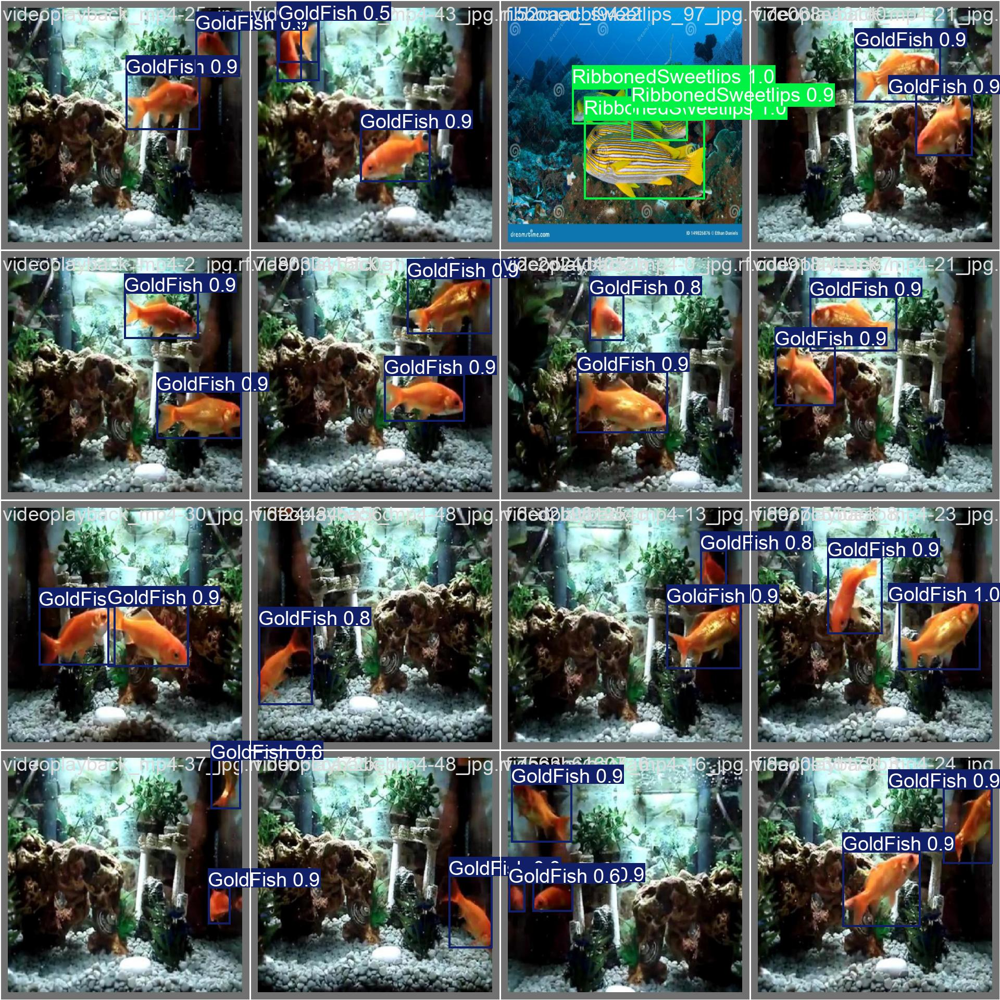

In [10]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

##Улучшенный бейзлайн

В качестве улучшений был изменен оптимизатор, увеличены батчи, добавлены новые параметры

In [14]:
train_results = model.train(
    data=f"{root}/data.yaml",
    epochs=10,
    batch=32,
    imgsz=640,
    device=0,
    optimizer="AdamW",
    momentum=0.9,
    lr0=0.0001,
    lrf=0.01,
    weight_decay=0.0005,
    #hsv_h=0.015,
    #hsv_s=0.7,
    #hsv_v=0.4,
    #flipud=0.5,
    #fliplr=0.5,
    #mosaic=1.0,
    #mixup=0.2,
    #degrees=10.0,
    #translate=0.1
)

Ultralytics 8.3.134 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, 

train: Scanning /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/train/labels.cache... 6842 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6842/6842 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 536, len(boxes) = 14154. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 219.6±137.8 MB/s, size: 37.0 KB)


val: Scanning /root/.cache/kagglehub/datasets/mahmoodyousaf/fish-dataset/versions/1/valid/labels.cache... 700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 700/700 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 84, len(boxes) = 1197. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      5.06G      1.288     0.9572       1.47         38        640: 100%|██████████| 214/214 [02:03<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.54it/s]

                   all        700       1197      0.844      0.814      0.875      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      5.82G      1.089     0.7577      1.326         34        640: 100%|██████████| 214/214 [01:55<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.66it/s]

                   all        700       1197      0.843      0.868      0.908      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      5.82G      1.044     0.6996      1.298         67        640: 100%|██████████| 214/214 [01:56<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.77it/s]

                   all        700       1197      0.864      0.897      0.921      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.82G      1.026     0.6745       1.28         37        640: 100%|██████████| 214/214 [01:54<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.57it/s]

                   all        700       1197      0.869      0.885       0.92      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      5.82G     0.9941     0.6449      1.257         53        640: 100%|██████████| 214/214 [01:58<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.71it/s]

                   all        700       1197      0.879      0.884      0.925      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      5.82G     0.9801     0.6244      1.249         45        640: 100%|██████████| 214/214 [01:56<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.72it/s]

                   all        700       1197      0.882      0.881      0.931      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      5.82G     0.9582     0.6099      1.234         57        640: 100%|██████████| 214/214 [01:55<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:08<00:00,  1.35it/s]

                   all        700       1197       0.87      0.887      0.927      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      5.82G     0.9555     0.5995      1.229         56        640: 100%|██████████| 214/214 [01:58<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.79it/s]

                   all        700       1197      0.875       0.88      0.928      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      5.82G      0.939     0.5796      1.216         43        640: 100%|██████████| 214/214 [01:55<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.55it/s]

                   all        700       1197      0.874      0.897      0.934      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      5.82G     0.9361     0.5781      1.212         69        640: 100%|██████████| 214/214 [01:59<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:06<00:00,  1.73it/s]

                   all        700       1197      0.893      0.884      0.933      0.703



10 epochs completed in 0.347 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 5.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.134 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,584,687 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:09<00:00,  1.13it/s]


                   all        700       1197      0.892      0.884      0.933      0.703
              BlueTang          7         23      0.874      0.902       0.92      0.834
         ButterflyFish         10         47      0.895      0.907      0.915       0.52
             ClownFish         28         41      0.872      0.829      0.945      0.704
              GoldFish         62        134      0.829      0.903      0.941      0.713
               Gourami        188        210      0.973          1      0.995      0.909
            MorishIdol         23         31      0.937      0.955       0.99      0.763
             PlatyFish         50        102      0.752      0.833      0.879      0.632
     RibbonedSweetlips         22         67       0.85      0.846      0.912      0.687
ThreeStripedDamselfish         79        108      0.954      0.952      0.984      0.811
         YellowCichlid         22         95      0.899      0.621      0.762      0.382
            YellowTan

mAP стал 0,93, что больше, чем до изменений

###Анализ

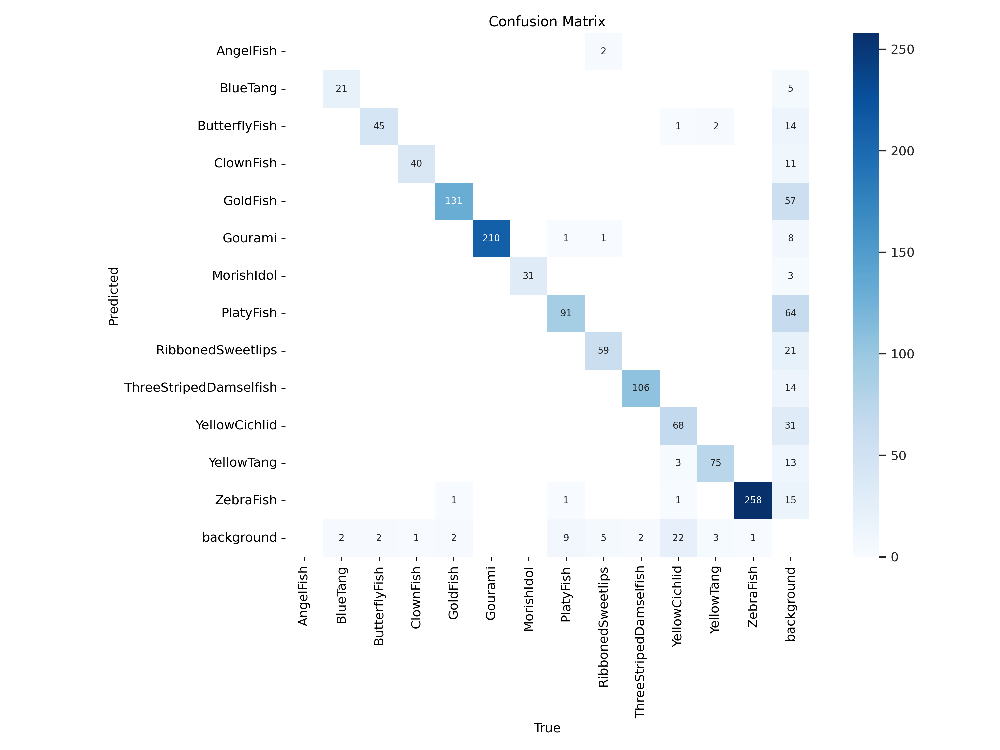

In [15]:
Image.open(f"runs/detect/train4/confusion_matrix.png")

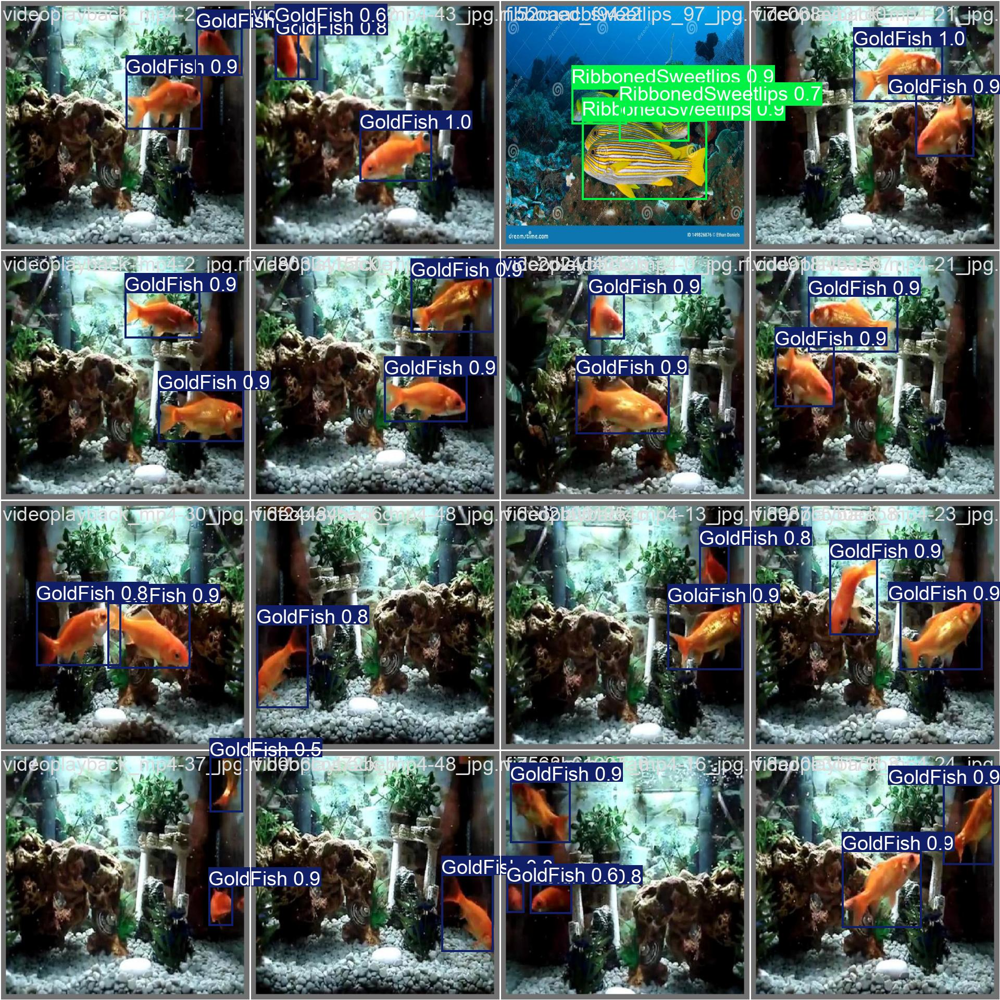

In [16]:
Image.open(f"runs/detect/train4/val_batch0_pred.jpg")

##Имплементация алгоритма

Функции потерь плохо показали себя в собственной реализации. Это может быть связано с сложностью алгоритма и малым количеством эпох из-за ограниченных ресурсов. В первоначальной реализации loss был равен NaN, так что это улучшение.

In [29]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
import os
import cv2
import numpy as np
from tqdm import tqdm
import kagglehub
from torch.cuda.amp import autocast, GradScaler
import time

path = kagglehub.dataset_download("mahmoodyousaf/fish-dataset")
print("Path to dataset files:", path)

def autopad(k, p=None):
    return p if p is not None else k // 2 if isinstance(k, int) else [x // 2 for x in k]

class Conv(nn.Module):
    def __init__(self, c1, c2, k=1, s=1, p=None, g=1, act=True):
        super().__init__()
        self.conv = nn.Conv2d(c1, c2, k, s, autopad(k, p), groups=g, bias=False)
        self.bn = nn.BatchNorm2d(c2)
        self.act = nn.SiLU() if act else nn.Identity()
    def forward(self, x):
        return self.act(self.bn(self.conv(x)))

class Bottleneck(nn.Module):
    def __init__(self, c1, c2, shortcut=True, g=1, e=0.5):
        super().__init__()
        c_ = int(c2 * e)
        self.cv1 = Conv(c1, c_, 1, 1)
        self.cv2 = Conv(c_, c2, 3, 1, g=g)
        self.add = shortcut and c1 == c2
    def forward(self, x):
        return x + self.cv2(self.cv1(x)) if self.add else self.cv2(self.cv1(x))

class C2f(nn.Module):
    def __init__(self, c1, c2, n=1, shortcut=False, g=1, e=0.5):
        super().__init__()
        self.c = c2 // 2
        self.cv1 = Conv(c1, c2, 1, 1)
        self.cv2 = Conv((2 + n) * self.c, c2, 1)
        self.m = nn.ModuleList(Bottleneck(self.c, self.c, shortcut, g, 1.0) for _ in range(n))
    def forward(self, x):
        y = list(self.cv1(x).split((self.c, self.c), 1))
        y.extend(m(y[-1]) for m in self.m)
        return self.cv2(torch.cat(y, 1))

class YOLOv8n(nn.Module):
    def __init__(self, num_classes=13):
        super().__init__()
        self.backbone = nn.Sequential(
            Conv(3, 32, 3, 2),
            Conv(32, 64, 3, 2),
            C2f(64, 64, 1),
            Conv(64, 128, 3, 2),
            C2f(128, 128, 2),
            Conv(128, 256, 3, 2),
            C2f(256, 256, 2),
            Conv(256, 512, 3, 2),
            C2f(512, 512, 1),
        )
        self.head = nn.Conv2d(512, num_classes + 5, 1)
    def forward(self, x):
        return self.head(self.backbone(x))

class FishDataset(Dataset):
    def __init__(self, split='train', transform=None):
        self.root = path
        self.img_dir = os.path.join(self.root, split, 'images')
        self.label_dir = os.path.join(self.root, split, 'labels')
        self.transform = transform
        self.imgs = [f for f in os.listdir(self.img_dir) if f.endswith('.jpg')]

    def __len__(self): return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.imgs[idx])
        label_path = os.path.join(self.label_dir, self.imgs[idx].replace('.jpg', '.txt'))
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        labels = []
        try:
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 5: continue
                    labels.append([float(x) for x in parts[:5]])
        except Exception as e:
            print(f"Ошибка в {label_path}: {e}")

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(labels)

def collate_fn(batch):
    images, targets = zip(*batch)
    return torch.stack(images, dim=0), list(targets)

transform = T.Compose([
    T.ToPILImage(),
    T.Resize((320, 320)),
    T.ColorJitter(0.2, 0.2),
    T.RandomHorizontalFlip(0.5),
    T.ToTensor(),
])

train_dataset = FishDataset(split='train', transform=transform)
val_dataset = FishDataset(split='valid', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=collate_fn, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=4, pin_memory=True)

def compute_loss(pred, targets, num_classes=13):
    device = pred.device
    B, C, H, W = pred.shape
    loss_bbox, loss_obj, loss_cls = 0., 0., 0.

    obj_mask = torch.zeros((B, H, W), device=device)
    tgt_box = torch.zeros((B, 4, H, W), device=device)
    tgt_cls = torch.zeros((B, num_classes, H, W), device=device)

    for b in range(B):
        target = targets[b]
        for t in target:
            cls, x, y, w, h = t
            cls = int(cls)
            gx, gy = x * W, y * H
            gw, gh = w * W, h * H
            gi, gj = int(gx), int(gy)
            if gi >= W or gj >= H: continue
            obj_mask[b, gj, gi] = 1.0
            tgt_box[b, :, gj, gi] = torch.tensor([gx - gi, gy - gj, gw, gh], device=device)
            tgt_cls[b, cls, gj, gi] = 1.0

    pred_box = pred[:, 0:4, :, :]
    pred_obj = pred[:, 4, :, :]
    pred_cls = pred[:, 5:, :, :]

    ciou = bbox_ciou(pred_box, tgt_box)
    if obj_mask.sum() == 0:
        loss_bbox = torch.tensor(0.0, device=device)
    else:
        loss_bbox = ((1 - ciou) * obj_mask).sum() / (obj_mask.sum() + 1e-6)

    loss_obj = nn.BCEWithLogitsLoss()(pred_obj, obj_mask)
    loss_cls = nn.BCEWithLogitsLoss()(pred_cls, tgt_cls)

    total_loss = 5.0 * loss_bbox + 1.0 * loss_obj + 1.0 * loss_cls

    if torch.isnan(total_loss) or torch.isinf(total_loss):
        print("NaN или Inf в потере! перескакиваем батч.")
        print("loss_bbox:", loss_bbox.item(), "loss_obj:", loss_obj.item(), "loss_cls:", loss_cls.item())
        return torch.tensor(0.0, device=device)

    return total_loss

def bbox_ciou(pred, target, eps=1e-7):
    px, py, pw, ph = pred[:, 0], pred[:, 1], pred[:, 2], pred[:, 3]
    tx, ty, tw, th = target[:, 0], target[:, 1], target[:, 2], target[:, 3]

    px1, py1, px2, py2 = px - pw/2, py - ph/2, px + pw/2, py + ph/2
    tx1, ty1, tx2, ty2 = tx - tw/2, ty - th/2, tx + tw/2, ty + th/2

    inter = (torch.min(px2, tx2) - torch.max(px1, tx1)).clamp(0) * (torch.min(py2, ty2) - torch.max(py1, ty1)).clamp(0)
    union = (px2 - px1) * (py2 - py1) + (tx2 - tx1) * (ty2 - ty1) - inter + eps
    iou = inter / union

    center_dist = (px - tx)**2 + (py - ty)**2
    enclose_w = torch.max(px2, tx2) - torch.min(px1, tx1)
    enclose_h = torch.max(py2, ty2) - torch.min(py1, ty1)
    enclose_diag = enclose_w**2 + enclose_h**2 + eps
    d = center_dist / enclose_diag

    v = (4 / (np.pi**2)) * (torch.atan(tw / (th + eps)) - torch.atan(pw / (ph + eps)))**2
    with torch.no_grad():
        alpha = v / (1 - iou + v + eps)
    return (iou - d - alpha * v).clamp(0, 1)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = YOLOv8n(num_classes=13).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scaler = GradScaler(enabled=torch.cuda.is_available())

for epoch in range(10):
    model.train()
    train_loss = 0.0
    start = time.time()
    loader = tqdm(train_loader, desc=f"[Epoch {epoch+1}/10] Training")

    for images, targets in loader:
        images = images.to(device, non_blocking=True)
        targets = [t.to(device) for t in targets]

        optimizer.zero_grad()
        with autocast():
            outputs = model(images)
            loss = compute_loss(outputs, targets, num_classes=13)

        if not torch.isnan(loss) and not torch.isinf(loss):
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_loss += loss.item()

        loader.set_postfix(loss=loss.item())

    model.eval()
    val_loss = 0.0
    val_loader_tqdm = tqdm(val_loader, desc=f"[Epoch {epoch+1}/10] Validating")
    with torch.no_grad():
        for images, targets in val_loader_tqdm:
            images = images.to(device, non_blocking=True)
            targets = [t.to(device) for t in targets]
            with autocast():
                outputs = model(images)
                loss = compute_loss(outputs, targets, num_classes=13)
            val_loss += loss.item()
            val_loader_tqdm.set_postfix(val_loss=loss.item())

    print(f"Epoch {epoch+1}/10 | "
          f"Train Loss: {train_loss/len(train_loader):.4f} | "
          f"Val Loss: {val_loss/len(val_loader):.4f} | "
          f"Time: {time.time() - start:.1f}s")

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Path to dataset files: /kaggle/input/fish-dataset


[Epoch 1/10] Validating: 100%|██████████| 44/44 [00:08<00:00,  5.04it/s, val_loss=6.48]


Epoch 1/10 | Train Loss: 6.4422 | Val Loss: 6.4414 | Time: 95.8s


[Epoch 2/10] Validating: 100%|██████████| 44/44 [00:08<00:00,  5.03it/s, val_loss=6.47]


Epoch 2/10 | Train Loss: 6.4424 | Val Loss: 6.4447 | Time: 96.2s


[Epoch 3/10] Validating: 100%|██████████| 44/44 [00:09<00:00,  4.67it/s, val_loss=6.43]


Epoch 3/10 | Train Loss: 6.4422 | Val Loss: 6.4395 | Time: 94.6s


[Epoch 4/10] Validating: 100%|██████████| 44/44 [00:08<00:00,  5.25it/s, val_loss=6.45]


Epoch 4/10 | Train Loss: 6.4420 | Val Loss: 6.4378 | Time: 93.3s


[Epoch 5/10] Validating: 100%|██████████| 44/44 [00:07<00:00,  5.99it/s, val_loss=6.42]


Epoch 5/10 | Train Loss: 6.4426 | Val Loss: 6.4369 | Time: 93.9s


[Epoch 6/10] Validating: 100%|██████████| 44/44 [00:07<00:00,  5.85it/s, val_loss=6.45]


Epoch 6/10 | Train Loss: 6.4420 | Val Loss: 6.4400 | Time: 92.3s


[Epoch 7/10] Validating: 100%|██████████| 44/44 [00:07<00:00,  5.71it/s, val_loss=6.45]


Epoch 7/10 | Train Loss: 6.4423 | Val Loss: 6.4388 | Time: 94.2s


[Epoch 8/10] Validating: 100%|██████████| 44/44 [00:08<00:00,  5.23it/s, val_loss=6.45]


Epoch 8/10 | Train Loss: 6.4421 | Val Loss: 6.4364 | Time: 93.1s


[Epoch 9/10] Validating: 100%|██████████| 44/44 [00:07<00:00,  5.87it/s, val_loss=6.48]


Epoch 9/10 | Train Loss: 6.4423 | Val Loss: 6.4305 | Time: 91.4s


[Epoch 10/10] Validating: 100%|██████████| 44/44 [00:07<00:00,  5.87it/s, val_loss=6.42]

Epoch 10/10 | Train Loss: 6.4422 | Val Loss: 6.4408 | Time: 91.5s


##Улучшенный бейзлайн

Применение таких же улучшений, как для библиотечной модели, немного улучшили результат, но очень слабо

In [30]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader
import os
import cv2
import numpy as np
from tqdm import tqdm
import kagglehub
from torch.cuda.amp import autocast, GradScaler
import time
from torch.optim.lr_scheduler import CosineAnnealingLR

path = kagglehub.dataset_download("mahmoodyousaf/fish-dataset")
print("Path to dataset files:", path)

EPOCHS = 10
BATCH_SIZE = 32
IMAGE_SIZE = 640
LR0 = 0.0001
LRF = 0.01
WEIGHT_DECAY = 0.0005

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def autopad(k, p=None):
    return p if p is not None else k // 2 if isinstance(k, int) else [x // 2 for x in k]

class Conv(nn.Module):
    def __init__(self, c1, c2, k=1, s=1, p=None, g=1, act=True):
        super().__init__()
        self.conv = nn.Conv2d(c1, c2, k, s, autopad(k, p), groups=g, bias=False)
        self.bn = nn.BatchNorm2d(c2)
        self.act = nn.SiLU() if act else nn.Identity()
    def forward(self, x): return self.act(self.bn(self.conv(x)))

class Bottleneck(nn.Module):
    def __init__(self, c1, c2, shortcut=True, g=1, e=0.5):
        super().__init__()
        c_ = int(c2 * e)
        self.cv1 = Conv(c1, c_, 1, 1)
        self.cv2 = Conv(c_, c2, 3, 1, g=g)
        self.add = shortcut and c1 == c2
    def forward(self, x): return x + self.cv2(self.cv1(x)) if self.add else self.cv2(self.cv1(x))

class C2f(nn.Module):
    def __init__(self, c1, c2, n=1, shortcut=False, g=1, e=0.5):
        super().__init__()
        self.c = c2 // 2
        self.cv1 = Conv(c1, c2, 1, 1)
        self.cv2 = Conv((2 + n) * self.c, c2, 1)
        self.m = nn.ModuleList(Bottleneck(self.c, self.c, shortcut, g, 1.0) for _ in range(n))
    def forward(self, x):
        y = list(self.cv1(x).split((self.c, self.c), 1))
        y.extend(m(y[-1]) for m in self.m)
        return self.cv2(torch.cat(y, 1))

class YOLOv8n(nn.Module):
    def __init__(self, num_classes=13):
        super().__init__()
        self.backbone = nn.Sequential(
            Conv(3, 32, 3, 2),
            Conv(32, 64, 3, 2),
            C2f(64, 64, 1),
            Conv(64, 128, 3, 2),
            C2f(128, 128, 2),
            Conv(128, 256, 3, 2),
            C2f(256, 256, 2),
            Conv(256, 512, 3, 2),
            C2f(512, 512, 1),
        )
        self.head = nn.Conv2d(512, num_classes + 5, 1)
    def forward(self, x):
        return self.head(self.backbone(x))

class FishDataset(Dataset):
    def __init__(self, split='train', transform=None):
        self.root = path
        self.img_dir = os.path.join(self.root, split, 'images')
        self.label_dir = os.path.join(self.root, split, 'labels')
        self.imgs = [f for f in os.listdir(self.img_dir) if f.endswith('.jpg')]
        self.transform = transform

    def __len__(self): return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.imgs[idx])
        label_path = os.path.join(self.label_dir, self.imgs[idx].replace('.jpg', '.txt'))
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        labels = []
        try:
            with open(label_path, 'r') as f:
                for line in f:
                    data = list(map(float, line.strip().split()))
                    if len(data) == 5:
                        labels.append(data)
        except:
            pass

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(labels)

def collate_fn(batch):
    images, targets = zip(*batch)
    return torch.stack(images), list(targets)

transform = T.Compose([
    T.ToPILImage(),
    T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    T.ColorJitter(0.2, 0.2),
    T.RandomHorizontalFlip(0.5),
    T.ToTensor(),
])

train_dataset = FishDataset(split='train', transform=transform)
val_dataset = FishDataset(split='valid', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn, num_workers=4, pin_memory=True)

def compute_loss(pred, targets, num_classes=13):
    device = pred.device
    B, C, H, W = pred.shape
    obj_mask = torch.zeros((B, H, W), device=device)
    tgt_box = torch.zeros((B, 4, H, W), device=device)
    tgt_cls = torch.zeros((B, num_classes, H, W), device=device)

    for b in range(B):
        target = targets[b]
        for t in target:
            cls, x, y, w, h = t
            cls = int(cls)
            gx, gy = x * W, y * H
            gw, gh = w * W, h * H
            gi, gj = int(gx), int(gy)
            if 0 <= gi < W and 0 <= gj < H:
                obj_mask[b, gj, gi] = 1.0
                tgt_box[b, :, gj, gi] = torch.tensor([gx - gi, gy - gj, gw, gh], device=device)
                tgt_cls[b, cls, gj, gi] = 1.0

    pred_box = pred[:, 0:4, :, :]
    pred_obj = pred[:, 4, :, :]
    pred_cls = pred[:, 5:, :, :]

    ciou = bbox_ciou(pred_box, tgt_box)
    box_loss = ((1 - ciou) * obj_mask).sum() / (obj_mask.sum() + 1e-6) if obj_mask.sum() > 0 else torch.tensor(0.0, device=device)
    obj_loss = nn.BCEWithLogitsLoss()(pred_obj, obj_mask)
    cls_loss = nn.BCEWithLogitsLoss()(pred_cls, tgt_cls)

    total = 5.0 * box_loss + 1.0 * obj_loss + 1.0 * cls_loss
    if torch.isnan(total) or torch.isinf(total):
        print("⚠️ NaN/Inf encountered in loss.")
        return torch.tensor(0.0, device=device)
    return total

def bbox_ciou(pred, target, eps=1e-7):
    px, py, pw, ph = pred.unbind(1)
    tx, ty, tw, th = target.unbind(1)

    px1, py1, px2, py2 = px - pw/2, py - ph/2, px + pw/2, py + ph/2
    tx1, ty1, tx2, ty2 = tx - tw/2, ty - th/2, tx + tw/2, ty + th/2

    inter = (torch.min(px2, tx2) - torch.max(px1, tx1)).clamp(0) * (torch.min(py2, ty2) - torch.max(py1, ty1)).clamp(0)
    union = (px2 - px1)*(py2 - py1) + (tx2 - tx1)*(ty2 - ty1) - inter + eps
    iou = inter / union

    center_dist = (px - tx)**2 + (py - ty)**2
    enclose_w = torch.max(px2, tx2) - torch.min(px1, tx1)
    enclose_h = torch.max(py2, ty2) - torch.min(py1, ty1)
    enclose_diag = enclose_w**2 + enclose_h**2 + eps
    d = center_dist / enclose_diag

    v = (4 / (np.pi**2)) * (torch.atan(tw / (th + eps)) - torch.atan(pw / (ph + eps)))**2
    with torch.no_grad():
        alpha = v / (1 - iou + v + eps)

    return (iou - d - alpha * v).clamp(0, 1)

model = YOLOv8n(num_classes=13).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR0, weight_decay=WEIGHT_DECAY)
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=LR0 * LRF)
scaler = GradScaler(enabled=torch.cuda.is_available())

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0
    start_time = time.time()

    for images, targets in tqdm(train_loader, desc=f"[Epoch {epoch+1}/{EPOCHS}] Train"):
        images = images.to(device, non_blocking=True)
        targets = [t.to(device) for t in targets]
        optimizer.zero_grad()

        with autocast():
            outputs = model(images)
            loss = compute_loss(outputs, targets)

        if not torch.isnan(loss):
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        train_loss += loss.item()

    scheduler.step()

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(val_loader, desc=f"[Epoch {epoch+1}/{EPOCHS}] Valid"):
            images = images.to(device, non_blocking=True)
            targets = [t.to(device) for t in targets]
            with autocast():
                outputs = model(images)
                loss = compute_loss(outputs, targets)
            val_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} | "
          f"Train Loss: {train_loss / len(train_loader):.4f} | "
          f"Val Loss: {val_loss / len(val_loader):.4f} | "
          f"LR: {scheduler.get_last_lr()[0]:.6f} | "
          f"Time: {time.time() - start_time:.1f}s")

Path to dataset files: /kaggle/input/fish-dataset


[Epoch 1/10] Train: 100%|██████████| 214/214 [03:21<00:00,  1.06it/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
[Epoch 1/10] Valid: 100%|██████████| 22/22 [00:22<00:00,  1.03s/it]


Epoch 1/10 | Train Loss: 6.3677 | Val Loss: 6.3688 | LR: 0.000098 | Time: 223.8s


[Epoch 2/10] Valid: 100%|██████████| 22/22 [00:17<00:00,  1.28it/s]


Epoch 2/10 | Train Loss: 6.3678 | Val Loss: 6.3651 | LR: 0.000091 | Time: 227.0s


[Epoch 3/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.33it/s]


Epoch 3/10 | Train Loss: 6.3680 | Val Loss: 6.3649 | LR: 0.000080 | Time: 232.1s


[Epoch 4/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.37it/s]


Epoch 4/10 | Train Loss: 6.3682 | Val Loss: 6.3664 | LR: 0.000066 | Time: 237.6s


[Epoch 5/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.29it/s]


Epoch 5/10 | Train Loss: 6.3682 | Val Loss: 6.3685 | LR: 0.000051 | Time: 234.0s


[Epoch 6/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.30it/s]


Epoch 6/10 | Train Loss: 6.3683 | Val Loss: 6.3652 | LR: 0.000035 | Time: 234.4s


[Epoch 7/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.34it/s]


Epoch 7/10 | Train Loss: 6.3678 | Val Loss: 6.3692 | LR: 0.000021 | Time: 233.1s


[Epoch 8/10] Valid: 100%|██████████| 22/22 [00:17<00:00,  1.25it/s]


Epoch 8/10 | Train Loss: 6.3680 | Val Loss: 6.3680 | LR: 0.000010 | Time: 242.1s


[Epoch 9/10] Valid: 100%|██████████| 22/22 [00:18<00:00,  1.22it/s]


Epoch 9/10 | Train Loss: 6.3680 | Val Loss: 6.3648 | LR: 0.000003 | Time: 242.3s


[Epoch 10/10] Valid: 100%|██████████| 22/22 [00:16<00:00,  1.33it/s]

Epoch 10/10 | Train Loss: 6.3686 | Val Loss: 6.3664 | LR: 0.000001 | Time: 241.2s
